In [1]:
#Importing libraries

import os
import pickle
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.image import imread
import matplotlib.image as mpimg
from tensorflow.keras.preprocessing import image

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPooling2D, BatchNormalization, MaxPool2D
from tensorflow.keras.optimizers import Adam

from subprocess import check_output
from sklearn.model_selection import train_test_split

from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import load_model

In [2]:
model_name = 'traffic_sign_classifier_01.h5'
model = load_model(model_name)

In [3]:
#Base input image data

img_height = 50
img_width = 50
channels = 3
image_shape = (img_height, img_width, channels)

In [4]:
#Inputting the image to be predicted

def load_and_reshape(img_path):
    my_image = image.load_img(img_path, target_size=image_shape)
    my_image = image.img_to_array(my_image)

    my_image = my_image / 255 # Transforming into array and normalizing it
    imgplot = plt.imshow(my_image) # Showing the image
    plt.show()
    print('Image that the network sees')
    my_image = np.expand_dims(my_image, axis=0) #Expanding from (30, 30, 3) to (1, 30, 30, 3)
    
    return my_image

In [5]:
classes = { 0:'Speed limit (20km/h)',
            1:'Speed limit (30km/h)', 
            2:'Speed limit (50km/h)', 
            3:'Speed limit (60km/h)', 
            4:'Speed limit (70km/h)', 
            5:'Speed limit (80km/h)', 
            6:'End of speed limit (80km/h)', 
            7:'Speed limit (100km/h)', 
            8:'Speed limit (120km/h)', 
            9:'No passing', 
            10:'No passing veh over 3.5 tons', 
            11:'Right-of-way at intersection', 
            12:'Priority road', 
            13:'Yield', 
            14:'Stop', 
            15:'No vehicles', 
            16:'Veh > 3.5 tons prohibited', 
            17:'No entry sens interzis', 
            18:'General caution', 
            19:'Dangerous curve left', 
            20:'Dangerous curve right', 
            21:'Double curve', 
            22:'Bumpy road', 
            23:'Slippery road', 
            24:'Road narrows on the right', 
            25:'Road work', 
            26:'Traffic signals', 
            27:'Pedestrians', 
            28:'Children crossing', 
            29:'Bicycles crossing', 
            30:'Beware of ice/snow',
            31:'Wild animals crossing', 
            32:'End of all restrictions', 
            33:'Turn right ahead', 
            34:'Turn left ahead', 
            35:'Ahead only', 
            36:'Go straight or right', 
            37:'Go straight or left', 
            38:'Keep right', 
            39:'Keep left', 
            40:'Roundabout mandatory', 
            41:'End of no passing', 
            42:'End no passing veh > 3.5 tons' }

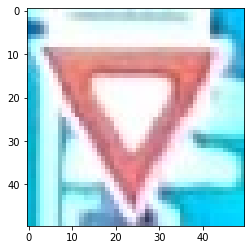

Image that the network sees
Image is predicted to be: Yield


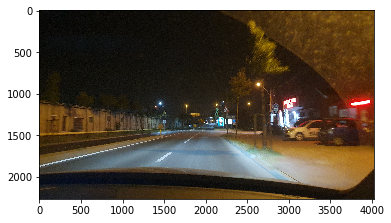

Original image
-------------------------------------------------------


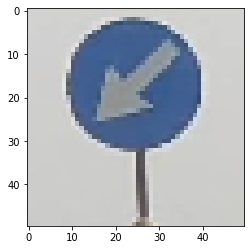

Image that the network sees
Image is predicted to be: Priority road


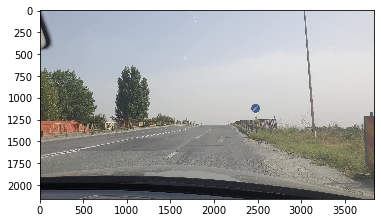

Original image
-------------------------------------------------------


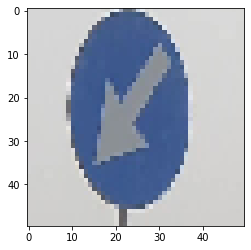

Image that the network sees
Image is predicted to be: No entry sens interzis


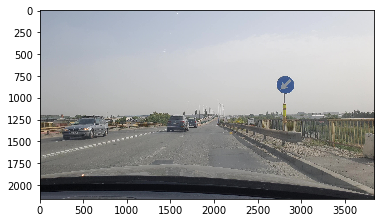

Original image
-------------------------------------------------------


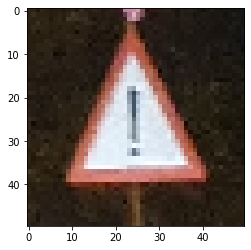

Image that the network sees
Image is predicted to be: General caution


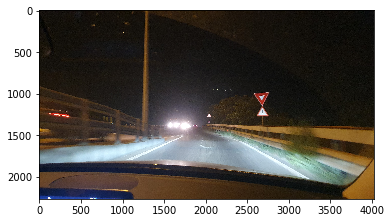

Original image
-------------------------------------------------------


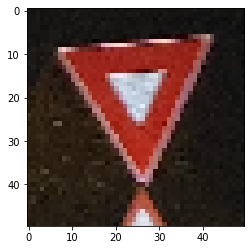

Image that the network sees
Image is predicted to be: Yield


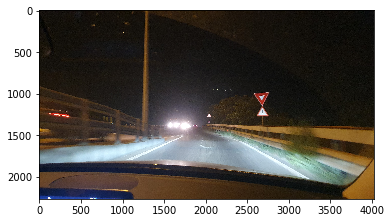

Original image
-------------------------------------------------------


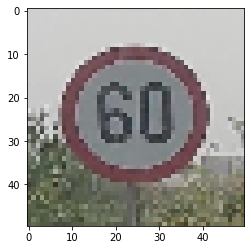

Image that the network sees
Image is predicted to be: Speed limit (80km/h)


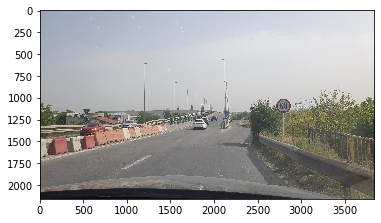

Original image
-------------------------------------------------------


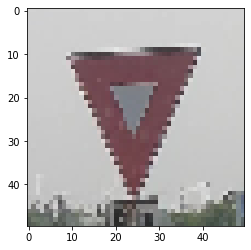

Image that the network sees
Image is predicted to be: Yield


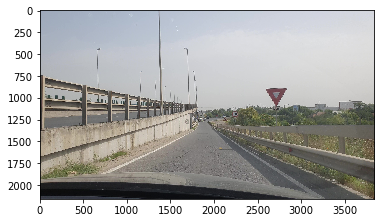

Original image
-------------------------------------------------------


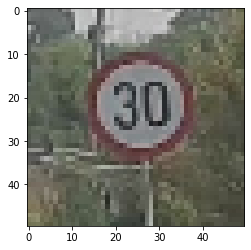

Image that the network sees
Image is predicted to be: Speed limit (50km/h)


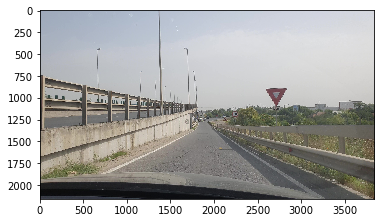

Original image
-------------------------------------------------------


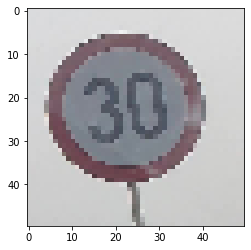

Image that the network sees
Image is predicted to be: Speed limit (30km/h)


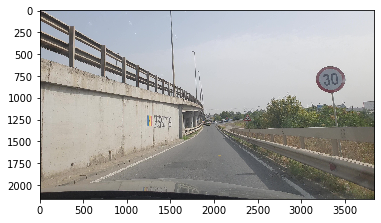

Original image
-------------------------------------------------------


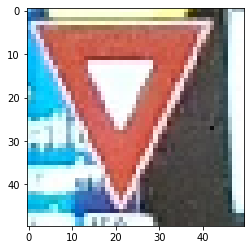

Image that the network sees
Image is predicted to be: Yield


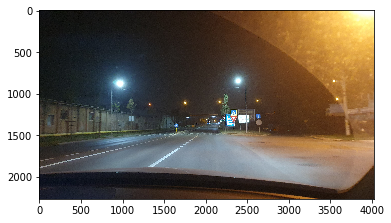

Original image
-------------------------------------------------------


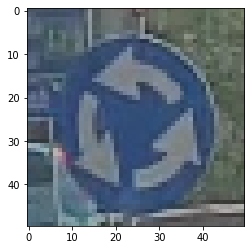

Image that the network sees
Image is predicted to be: Speed limit (50km/h)


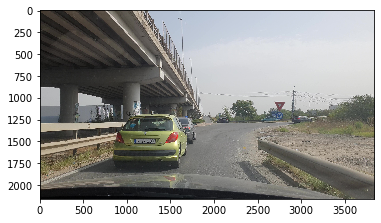

Original image
-------------------------------------------------------


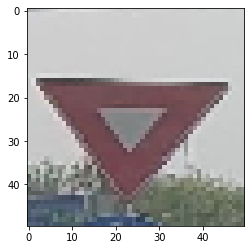

Image that the network sees
Image is predicted to be: Yield


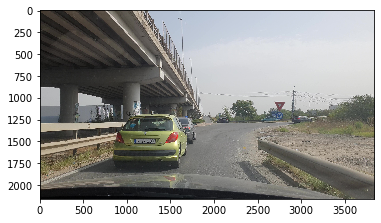

Original image
-------------------------------------------------------


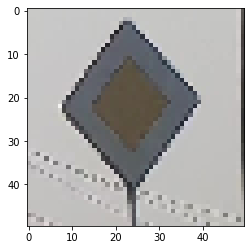

Image that the network sees
Image is predicted to be: Priority road


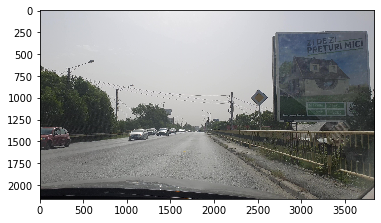

Original image
-------------------------------------------------------


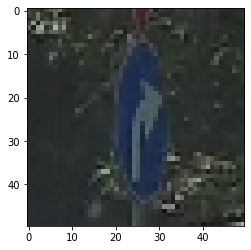

Image that the network sees
Image is predicted to be: Road work


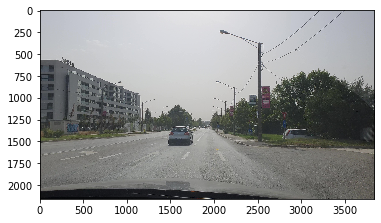

Original image
-------------------------------------------------------


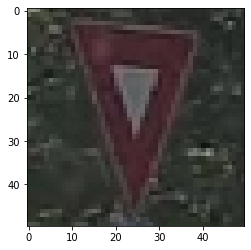

Image that the network sees
Image is predicted to be: Yield


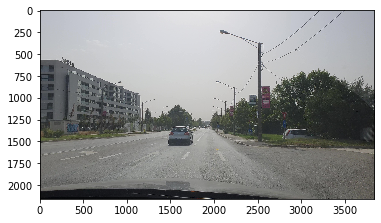

Original image
-------------------------------------------------------


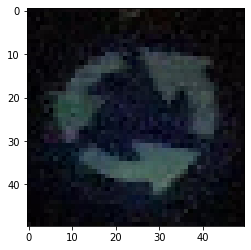

Image that the network sees
Image is predicted to be: Priority road


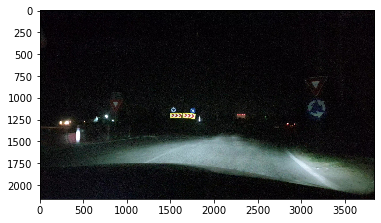

Original image
-------------------------------------------------------


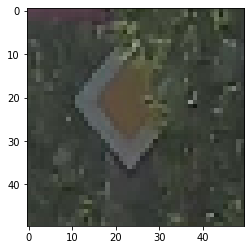

Image that the network sees
Image is predicted to be: Priority road


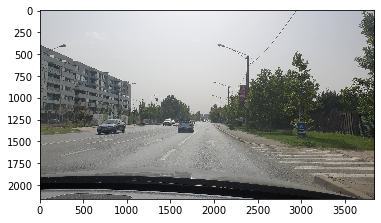

Original image
-------------------------------------------------------


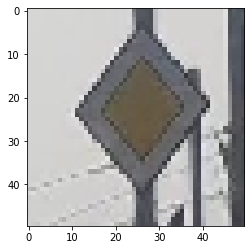

Image that the network sees
Image is predicted to be: Roundabout mandatory


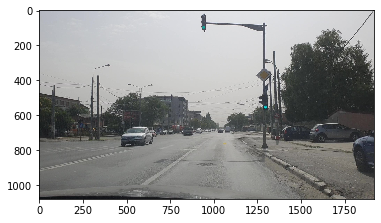

Original image
-------------------------------------------------------


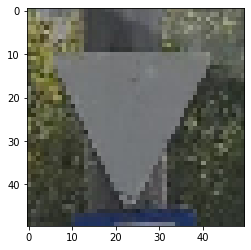

Image that the network sees
Image is predicted to be: Yield


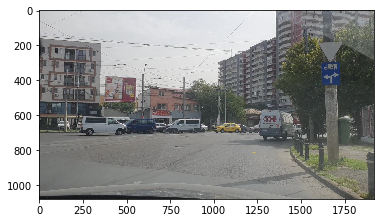

Original image
-------------------------------------------------------


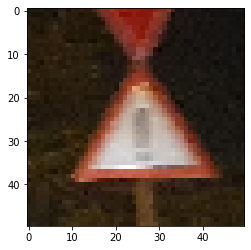

Image that the network sees
Image is predicted to be: General caution


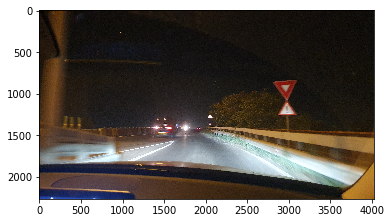

Original image
-------------------------------------------------------


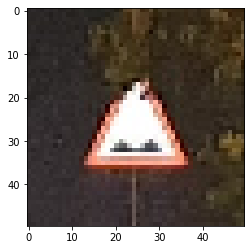

Image that the network sees
Image is predicted to be: Bumpy road


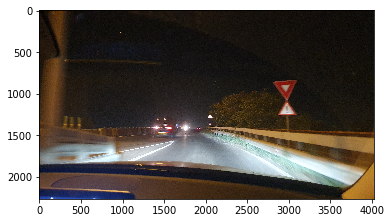

Original image
-------------------------------------------------------


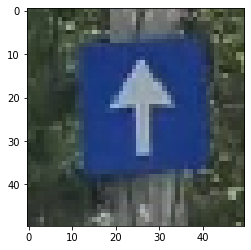

Image that the network sees
Image is predicted to be: Stop


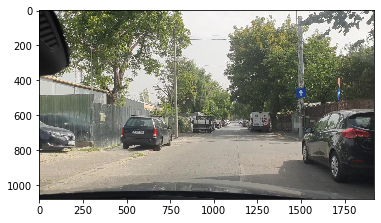

Original image
-------------------------------------------------------


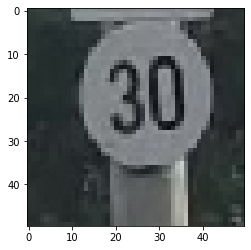

Image that the network sees
Image is predicted to be: Speed limit (30km/h)


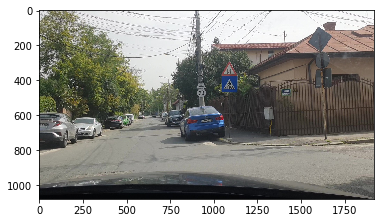

Original image
-------------------------------------------------------


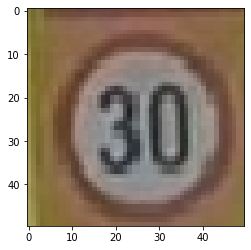

Image that the network sees
Image is predicted to be: Speed limit (30km/h)


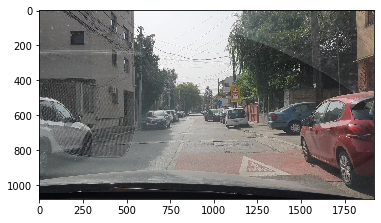

Original image
-------------------------------------------------------


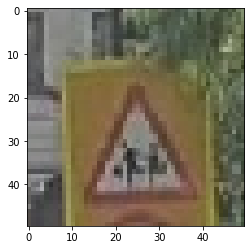

Image that the network sees
Image is predicted to be: Bicycles crossing


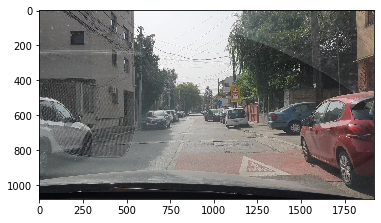

Original image
-------------------------------------------------------


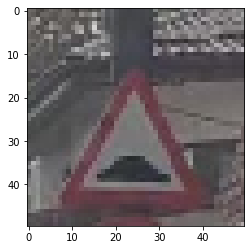

Image that the network sees
Image is predicted to be: Road work


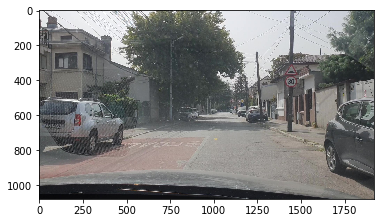

Original image
-------------------------------------------------------


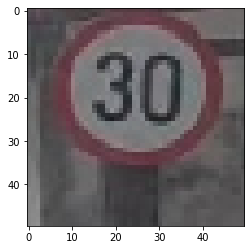

Image that the network sees
Image is predicted to be: Speed limit (30km/h)


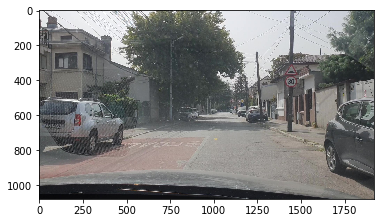

Original image
-------------------------------------------------------


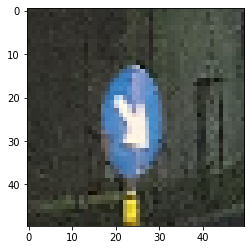

Image that the network sees
Image is predicted to be: Priority road


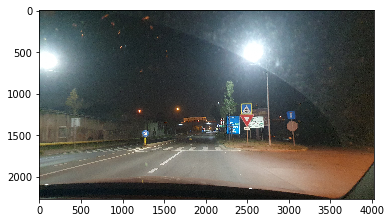

Original image
-------------------------------------------------------


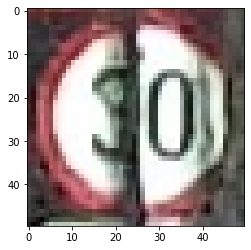

Image that the network sees
Image is predicted to be: Speed limit (30km/h)


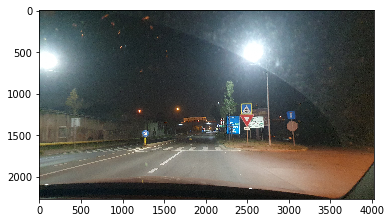

Original image
-------------------------------------------------------


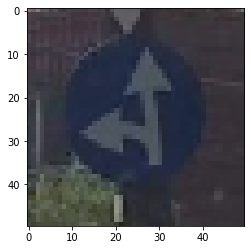

Image that the network sees
Image is predicted to be: No entry sens interzis


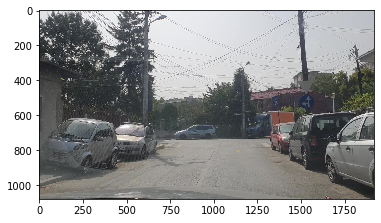

Original image
-------------------------------------------------------


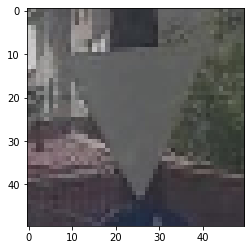

Image that the network sees
Image is predicted to be: Yield


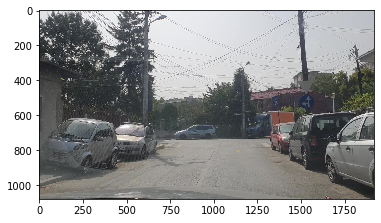

Original image
-------------------------------------------------------


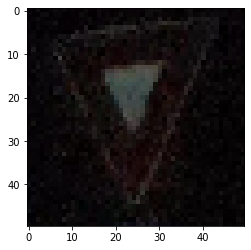

Image that the network sees
Image is predicted to be: Yield


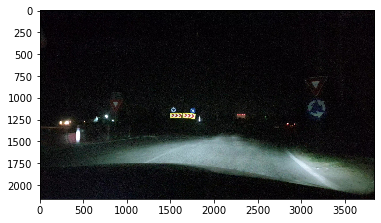

Original image
-------------------------------------------------------


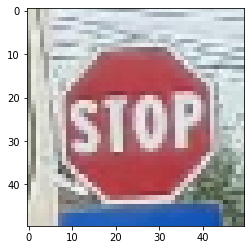

Image that the network sees
Image is predicted to be: Speed limit (70km/h)


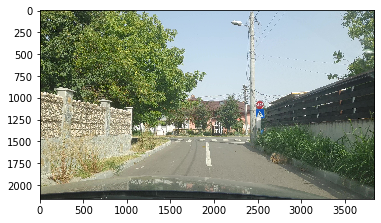

Original image
-------------------------------------------------------


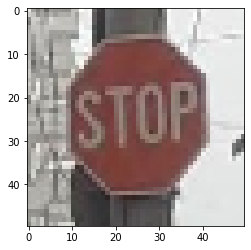

Image that the network sees
Image is predicted to be: Turn right ahead


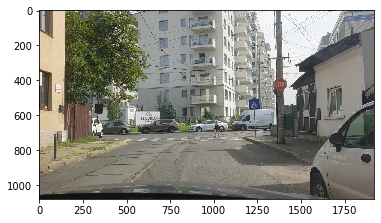

Original image
-------------------------------------------------------


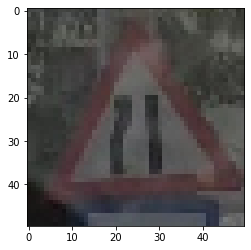

Image that the network sees
Image is predicted to be: General caution


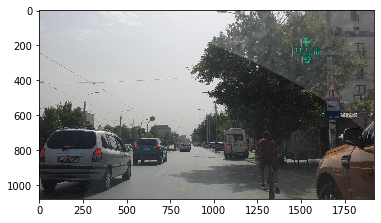

Original image
-------------------------------------------------------


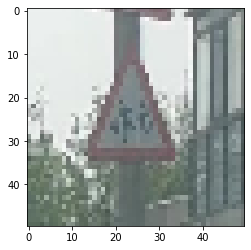

Image that the network sees
Image is predicted to be: Dangerous curve right


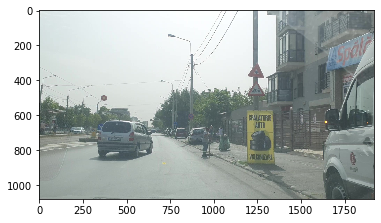

Original image
-------------------------------------------------------


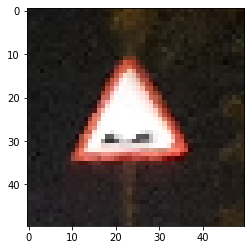

Image that the network sees
Image is predicted to be: Bumpy road


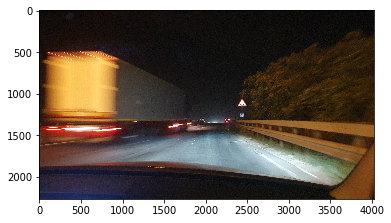

Original image
-------------------------------------------------------


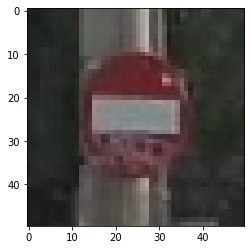

Image that the network sees
Image is predicted to be: No passing


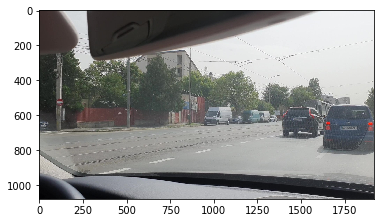

Original image
-------------------------------------------------------


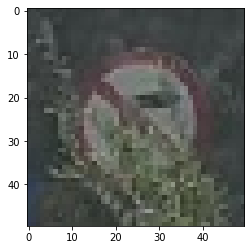

Image that the network sees
Image is predicted to be: Speed limit (30km/h)


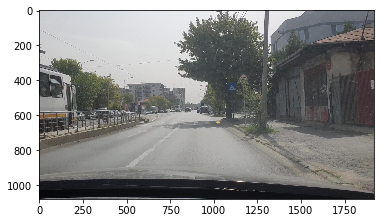

Original image
-------------------------------------------------------


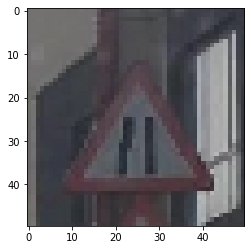

Image that the network sees
Image is predicted to be: General caution


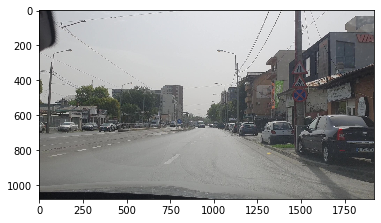

Original image
-------------------------------------------------------


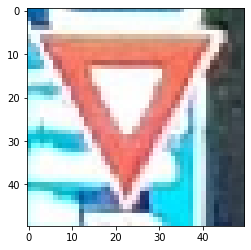

Image that the network sees
Image is predicted to be: Yield


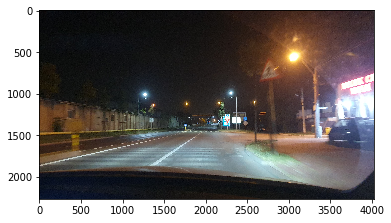

Original image
-------------------------------------------------------


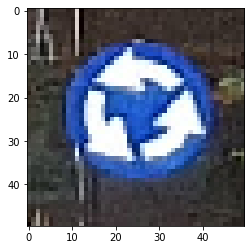

Image that the network sees
Image is predicted to be: Speed limit (120km/h)


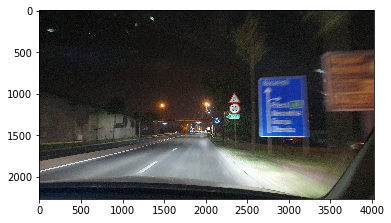

Original image
-------------------------------------------------------


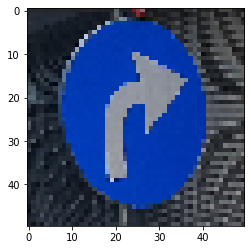

Image that the network sees
Image is predicted to be: Stop


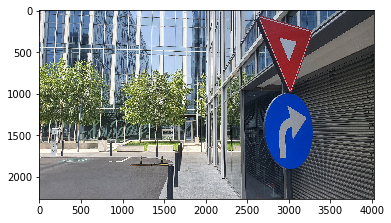

Original image
-------------------------------------------------------


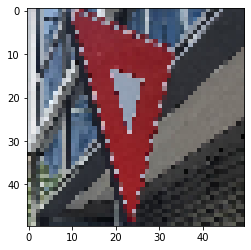

Image that the network sees
Image is predicted to be: Road work


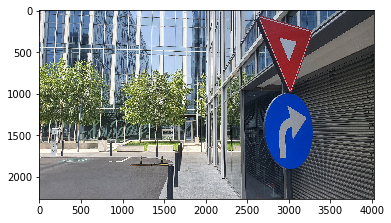

Original image
-------------------------------------------------------


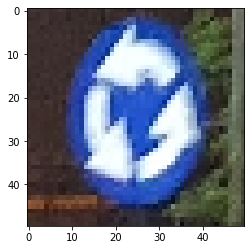

Image that the network sees
Image is predicted to be: Speed limit (80km/h)


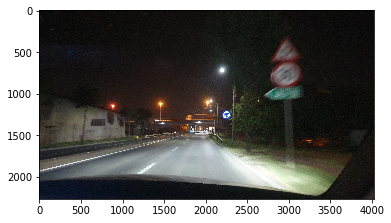

Original image
-------------------------------------------------------


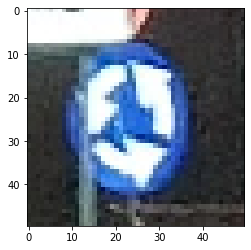

Image that the network sees
Image is predicted to be: Priority road


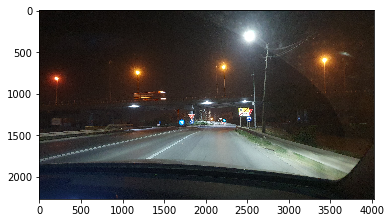

Original image
-------------------------------------------------------


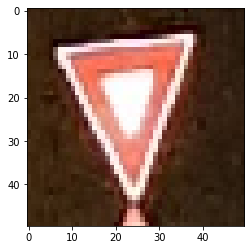

Image that the network sees
Image is predicted to be: Yield


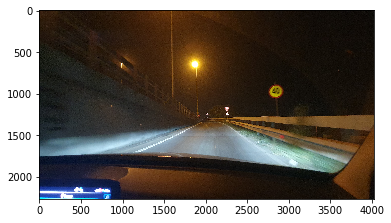

Original image
-------------------------------------------------------


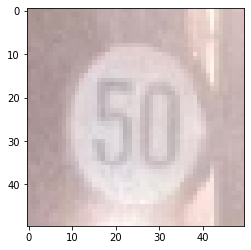

Image that the network sees
Image is predicted to be: Speed limit (50km/h)


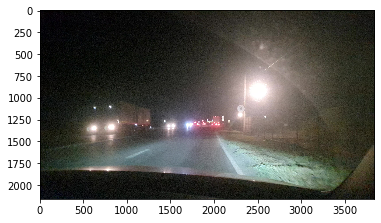

Original image
-------------------------------------------------------


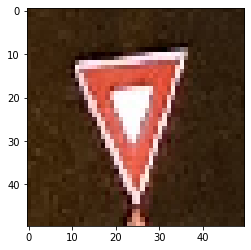

Image that the network sees
Image is predicted to be: Yield


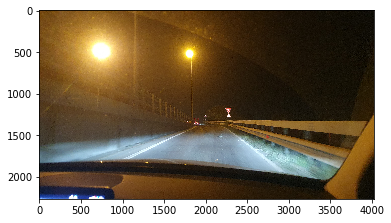

Original image
-------------------------------------------------------


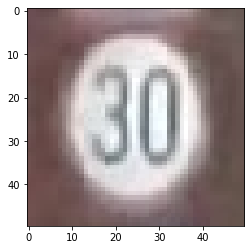

Image that the network sees
Image is predicted to be: Speed limit (30km/h)


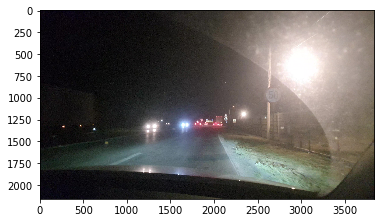

Original image
-------------------------------------------------------


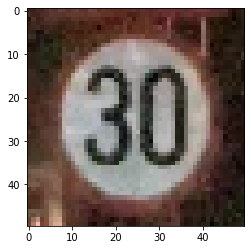

Image that the network sees
Image is predicted to be: Speed limit (30km/h)


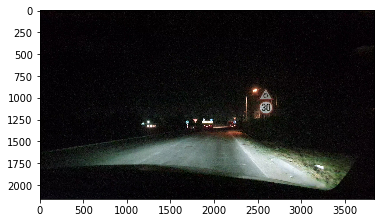

Original image
-------------------------------------------------------


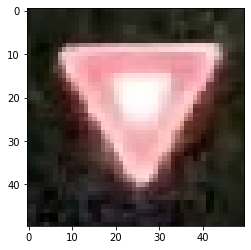

Image that the network sees
Image is predicted to be: Yield


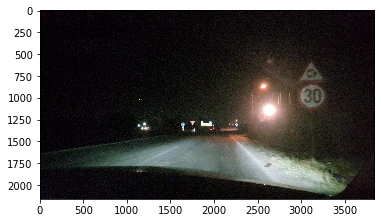

Original image
-------------------------------------------------------


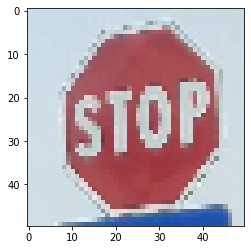

Image that the network sees
Image is predicted to be: Turn left ahead


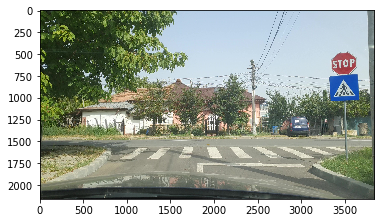

Original image
-------------------------------------------------------


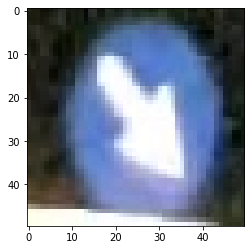

Image that the network sees
Image is predicted to be: Yield


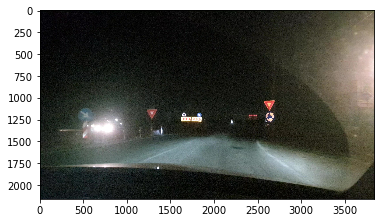

Original image
-------------------------------------------------------


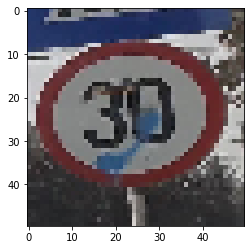

Image that the network sees
Image is predicted to be: Speed limit (30km/h)


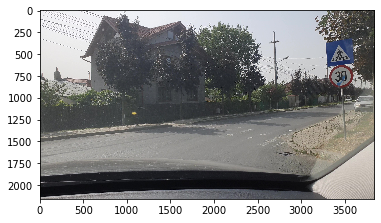

Original image
-------------------------------------------------------


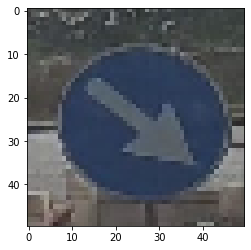

Image that the network sees
Image is predicted to be: Yield


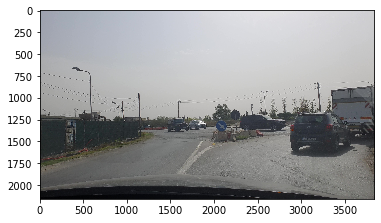

Original image
-------------------------------------------------------


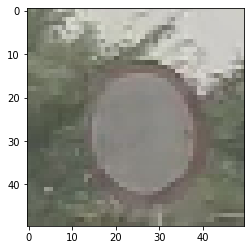

Image that the network sees
Image is predicted to be: No vehicles


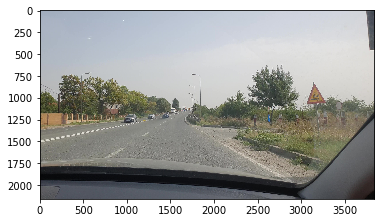

Original image
-------------------------------------------------------


In [6]:
folder_path = './/test'
original_path = './/reallifeimages'
for i in os.listdir(folder_path):
    image_path = folder_path + '//'+ i
    my_image = load_and_reshape(image_path)
    pred_class = np.argmax(model.predict(my_image), axis=-1)
    print(f"Image is predicted to be: {classes[pred_class[0]]}")
    
    i = i.partition(".")[0]
    i = i.partition("_")[0]
    img = mpimg.imread(original_path + '//' + i + '.jpg')
    imgplot = plt.imshow(img)
    plt.show()
    print('Original image')
    print('-------------------------------------------------------')